## Imports

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import muon as mu
import scanpy as sc
import mofax
import anndata as ad
from scipy.stats import pearsonr
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scanpy.plotting import palettes
from urllib.error import HTTPError

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


## Define some paths

In [3]:
# Define the folder containing data.
data_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/data/"

# Define the folder where to save figures.
fig_folder = "/users/csb/huizing/Documents/PhD/Code/"
fig_folder += "mowgli_reproducibility/visualize/figures/"

# Define the folder for enrichment results.
enrich_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/"

# Define the folder containing Mowgli's embeddings.
w_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/w/"

# Define the folder containing Mowgli's loadings.
h_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/h/"

sc.settings.figdir = fig_folder

## Loading the data

In [4]:
# Load the raw RNA signal.
rna_all_genes = mu.read_10x_h5(
    data_folder
    + "TEA/GSM4949911_X061-AP0C1W1_leukopak_perm-cells_"
    + "tea_fulldepth_cellranger-arc_filtered_feature_bc_matrix.h5",
    extended=False,
)["rna"]
rna_all_genes.var_names = ["rna:" + x for x in rna_all_genes.var_names]

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
# Load the azimuth annotation.
azimuth_pred = pd.read_csv(data_folder + "TEA/azimuth_pred.tsv", sep="\t", index_col=0)

In [6]:
# Compute quality control metrics and perform basic preprocessing.
rna_all_genes.var["mt"] = rna_all_genes.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    rna_all_genes,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,
    inplace=True,
)
mu.pp.filter_obs(rna_all_genes, "n_genes_by_counts", lambda x: (x >= 500) & (x < 4_500))
mu.pp.filter_obs(rna_all_genes, "total_counts", lambda x: x < 12_000)
mu.pp.filter_obs(rna_all_genes, "pct_counts_mt", lambda x: x < 30)
mu.pp.filter_var(rna_all_genes, "n_cells_by_counts", lambda x: x >= 10)
sc.pp.normalize_total(rna_all_genes, target_sum=1e4)  # Perform per-cell normalization.
sc.pp.log1p(rna_all_genes)  # Log-transform the counts.

# Load the preprocessed data.
mdata = mu.read_h5mu(data_folder + "TEA/tea_preprocessed.h5mu.gz")

# Load the MOFA model.
mofa_model = mofax.mofa_model(data_folder + "TEA/tea_mofa_15.hdf5")
mdata.obsm["X_mofa"] = mofa_model.get_factors()

# Load the Mowgli model.
mdata.obsm["X_mowgli"] = np.load(
    w_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()["W"]

# This is needed somehow.
mdata.uns = {}

# Subset rna_all_genes to the cells in mdata.
rna_all_genes = rna_all_genes[mdata["rna"].obs_names]
rna_all_genes.var_names_make_unique()

# Load MOFA+'s loadings.
H_mofa = {
    "H_rna": mofa_model.get_weights("rna"),
    "H_atac": mofa_model.get_weights("atac"),
    "H_adt": mofa_model.get_weights("adt"),
}

# Load Mowgli's loadings.
H_mowgli = np.load(
    h_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [7]:
# Define the method used for enrichement.
enrichment_file = "gprofiler"  # or "fgsea" or "enrichr"

# Get fgsea results.
if enrichment_file == "fgsea":

    # Load the fgsea results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "fgsea.csv", index_col=0)
    cols = {"pathway": "native", "col": "dim", "pval": "p_value"}
    enr.rename(columns=cols, inplace=True)
    enr["dim"] = enr["dim"].str.replace("X", "").astype(int)

# Get gprofiler results.
elif enrichment_file == "gprofiler":

    # Load the gprofiler results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichment.csv", index_col=0)
    enr["dim"] = enr["query"].str.split(" ", expand=True)[1].astype(int)

# Get enrichr results.
elif enrichment_file == "enrichr":

    # Load the enrichr results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichr.csv", index_col=0)
    enr.rename(columns={"path_name": "native", "adj_p_val": "p_value"}, inplace=True)

# Add some more columns.
enr["name"] = enr["native"]
enr = enr[enr["p_value"] < 0.05]
enr["minlogp"] = -np.log10(enr["p_value"])

In [8]:
# Define the motifs.

all_motifs = pd.DataFrame({})

# Mowgli
motifs_path = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/top_motifs_mowgli/"
for i in range(50):
    motifs = pd.read_csv(motifs_path + f"motifs_{i}.csv", index_col=0)
    motifs = motifs[motifs["p.adjust"] < .05]
    motifs = motifs[motifs["motif"].str.startswith("MA")]
    motifs["dim"] = i
    motifs["method"] = "mowgli"
    all_motifs = pd.concat((all_motifs, motifs))

all_motifs["minlogp"] = -np.log10(all_motifs["p.adjust"])

In [9]:
mdata.obs[azimuth_pred.columns] = azimuth_pred.loc[mdata.obs_names]

In [10]:
# Add mofa or mowgli dimensions.
mdata.obs[mdata["adt"].var_names] = mdata["adt"].X
mdata.obs[[f"mofa:{i}" for i in range(15)]] = mdata.obsm["X_mofa"]
mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]

<ipython-input-10-1b122876dc81>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]
<ipython-input-10-1b122876dc81>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]
<ipython-input-10-1b122876dc81>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

## Plotting the data

In [11]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mofa_neighbors", use_rep="X_mofa")
sc.tl.leiden(mdata, resolution=0.2, key_added="mofa_leiden", neighbors_key="mofa_neighbors")
sc.tl.umap(mdata, neighbors_key="mofa_neighbors")
mdata.obsm["X_umap_mofa"] = mdata.obsm["X_umap"]

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


In [12]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mowgli_neighbors", use_rep="X_mowgli")
sc.tl.leiden(mdata, resolution=0.2, key_added="mowgli_leiden", neighbors_key="mowgli_neighbors")
sc.tl.umap(mdata, neighbors_key="mowgli_neighbors")
mdata.obsm["X_umap_mowgli"] = mdata.obsm["X_umap"]

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


In [13]:
# Annotate the MOFA+ embedding.
mofa_cluster_names = {
    0: "CD4 T cells",
    1: "B cells",
    2: "CD4 T cells",
    3: "Monocytes",
    4: "CD8 T cells",
    5: "NK cells",
    6: "CD8 T cells",
    7: "MAIT T cells",
    8: "B cells",
    9: "Erythroid cells",
}
codes = mdata.obs["mofa_leiden"].cat.codes
mdata.obs["annotation_mofa"] = [mofa_cluster_names[c] for c in codes]

<ipython-input-13-e13a85b26ee1>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs["annotation_mofa"] = [mofa_cluster_names[c] for c in codes]


In [14]:
# Annotate the Mowgli embedding.
mowgli_cluster_names = {
    0: "B cells",
    1: "CD4 T cells",
    2: "CD4 T cells",
    3: "CD8 T cells",
    4: "CD4 T cells",
    5: "Monocytes",
    6: "NK cells",
    7: "MAIT T cells",
    8: "Erythroid cells",
}
codes = mdata.obs["mowgli_leiden"].cat.codes
mdata.obs["annotation_mowgli"] = [mowgli_cluster_names[c] for c in codes]

<ipython-input-14-4d0d9bcca83a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs["annotation_mowgli"] = [mowgli_cluster_names[c] for c in codes]


## Azimuth annotation

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predicted.celltype.l2' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predicted.celltype.l3' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be 

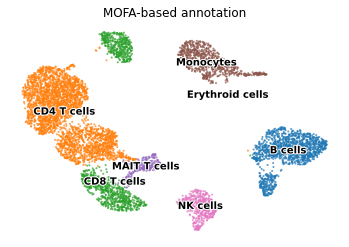

In [15]:
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="annotation_mofa",
    title="MOFA-based annotation",
    legend_loc="on data",
    legend_fontoutline=2,
    alpha=0.7,
    frameon=False,
    show=False,
)
plt.savefig(fig_folder + "annotation_mofa.pdf", bbox_inches="tight")

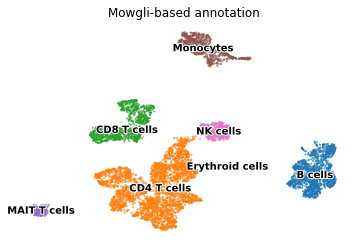

In [16]:
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="annotation_mowgli",
    title="Mowgli-based annotation",
    legend_loc="on data",
    legend_fontoutline=2,
    alpha=0.7,
    frameon=False,
    show=False,
)
plt.savefig(fig_folder + "annotation_mowgli.pdf", bbox_inches="tight")

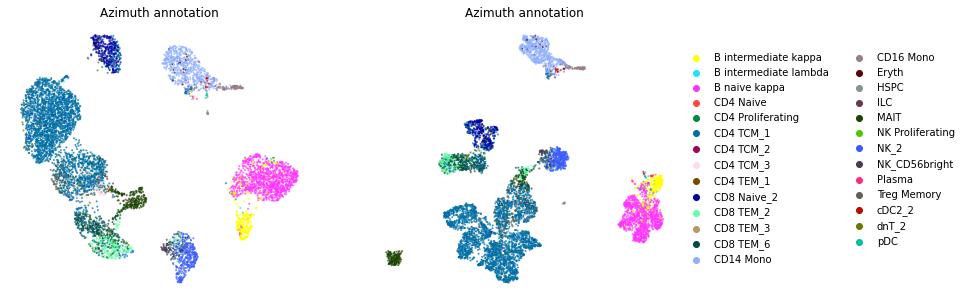

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 1*5))

sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="predicted.celltype.l3",
    title="Azimuth annotation",
    legend_loc="none",
    alpha=0.7,
    frameon=False,
    ax=axes[0],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="predicted.celltype.l3",
    title="Azimuth annotation",
    frameon=False,
    alpha=0.7,
    ax=axes[1],
    show=False,
    palette=palettes.default_102,
)
plt.savefig(fig_folder + "annotation_azimuth.pdf", bbox_inches="tight")

## MOFA embedding

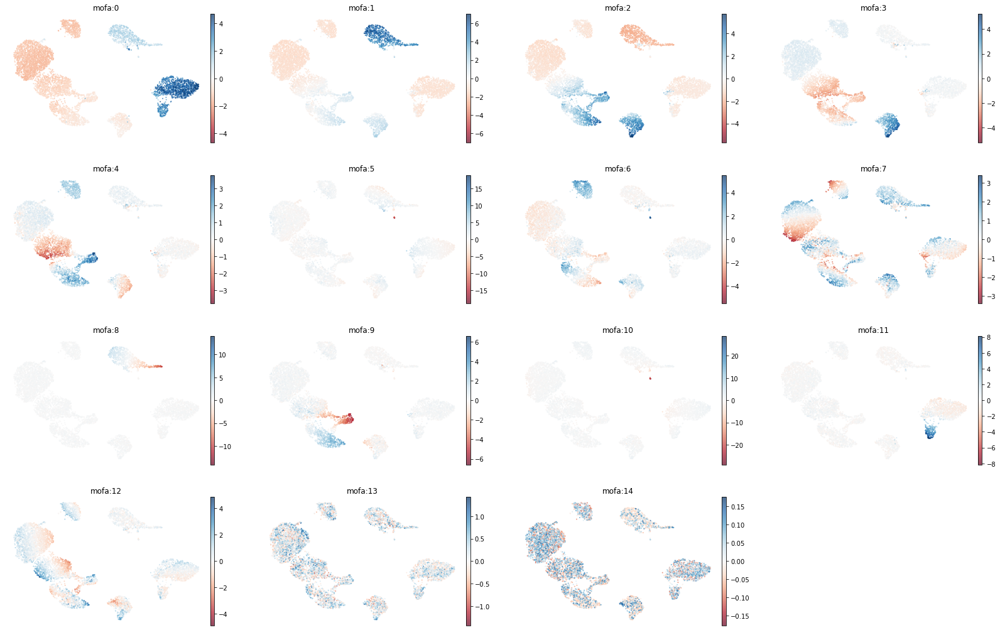

In [18]:
vmax = mdata.obs[[f"mofa:{i}" for i in range(15)]].abs().max().max()
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    alpha=0.7,
    color=[f"mofa:{i}" for i in range(15)],
    legend_fontoutline=2,
    frameon=False,
    color_map="RdBu",
    vmax=lambda x: np.max(np.abs(x)),
    vmin=lambda x: -np.max(np.abs(x)),
    show=False,
)
plt.savefig(fig_folder + "mofa.pdf", bbox_inches="tight")

## Mowgli embedding

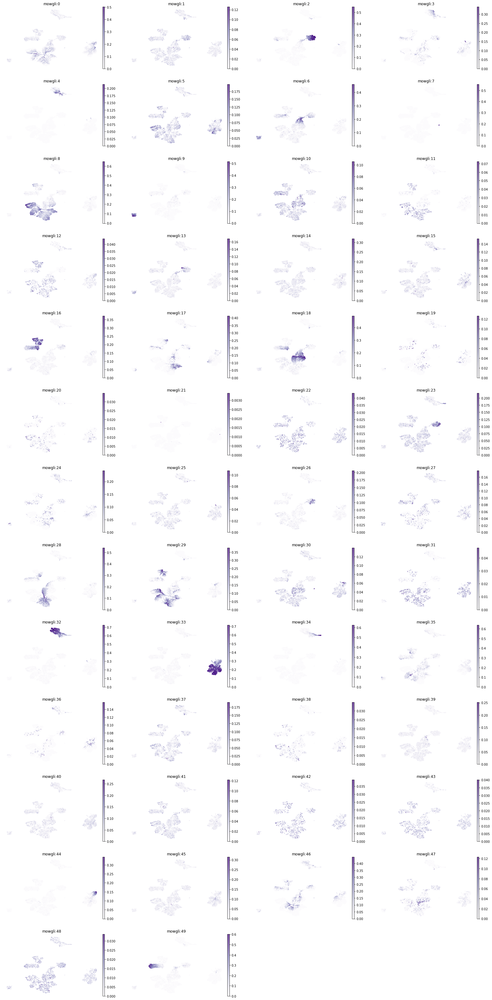

In [19]:
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    alpha=0.7,
    color=[f"mowgli:{i}" for i in range(50)],
    legend_fontoutline=2,
    frameon=False,
    color_map="Purples",
    show=False,
)
plt.savefig(fig_folder + "mowgli.pdf", bbox_inches="tight")

## Proteins

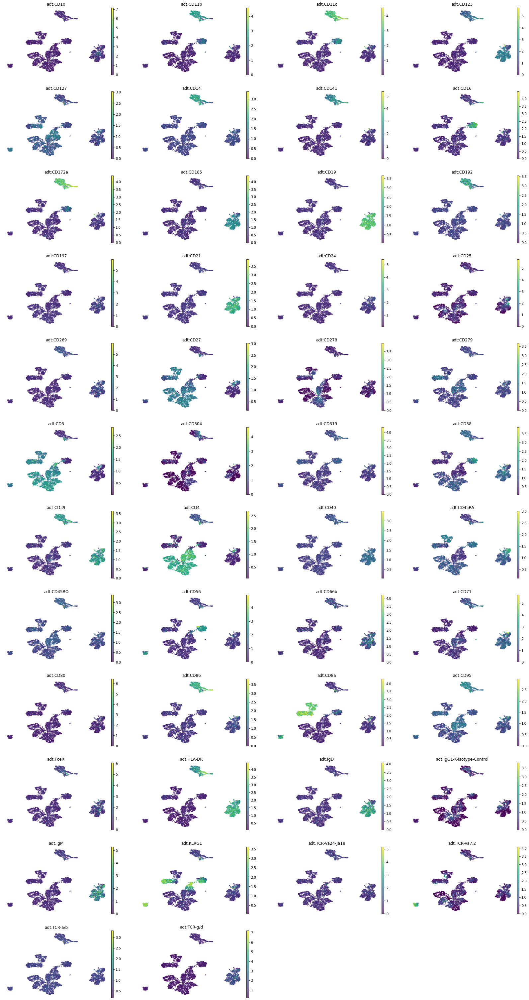

<Figure size 432x288 with 0 Axes>

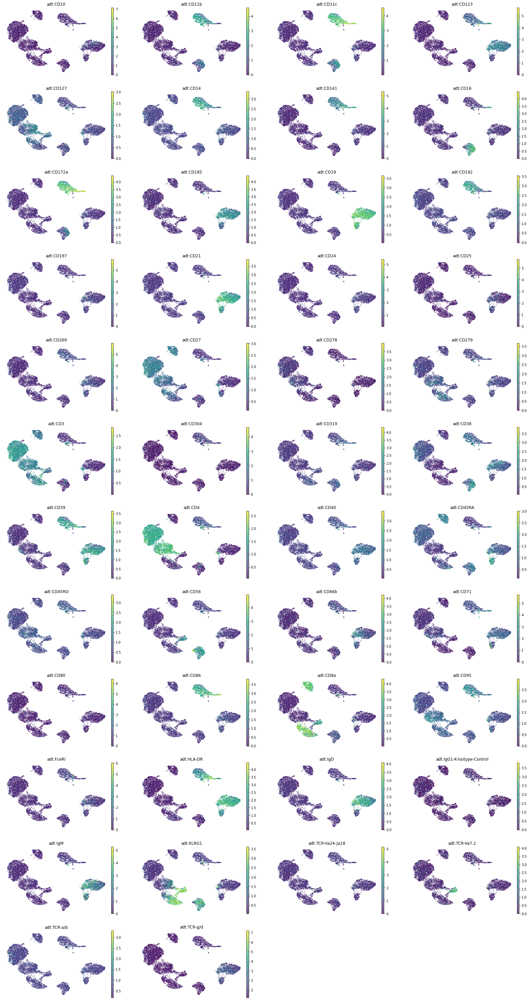

<Figure size 432x288 with 0 Axes>

In [20]:
mdata.obs[mdata["adt"].var_names] = mdata["adt"].X
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    alpha=0.7,
    color=mdata["adt"].var_names.to_list(),
    legend_fontoutline=2,
    frameon=False,
    save=False,
)
plt.savefig(fig_folder + "mowgli_adt.pdf", bbox_inches="tight")
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    alpha=0.7,
    color=mdata["adt"].var_names.to_list(),
    legend_fontoutline=2,
    frameon=False,
    save=False,
)
plt.savefig(fig_folder + "mofa_adt.pdf", bbox_inches="tight")

In [21]:
rna_all_genes.obsm["X_umap_mowgli"] = mdata.obsm["X_umap_mowgli"]
rna_all_genes.obsm["X_umap_mofa"] = mdata.obsm["X_umap_mofa"]

In [22]:
import plotly.graph_objects as go

annot_azimuth = mdata.obs["predicted.celltype.l1"]
annot_mofa = mdata.obs["annotation_mofa"]
annot_mowgli = mdata.obs["annotation_mowgli"]

categories_mowgli = np.sort(annot_mowgli.cat.categories).tolist()
categories_azimuth = np.sort(annot_azimuth.cat.categories).tolist()
categories_mofa = np.sort(annot_mofa.cat.categories).tolist()

categories = categories_mowgli + categories_azimuth + categories_mofa

source = []
target = []
value = []

for i, a in enumerate(categories_mowgli):
    for j, b in enumerate(categories_azimuth):
        source.append(i)
        target.append(len(categories_mowgli) + j)
        value.append(np.sum((annot_mowgli == a) & (annot_azimuth == b)))

for i, a in enumerate(categories_azimuth):
    for j, b in enumerate(categories_mofa):
        source.append(len(categories_mowgli) + i)
        target.append(len(categories_mowgli) + len(categories_azimuth) + j)
        value.append(np.sum((annot_azimuth == a) & (annot_mofa == b)))


fig = go.Figure(
    data=[
        go.Sankey(
            node=dict(
                pad=10,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=categories,
                color=[
                    "#002626", "#0E4749", "#E6E075", "#F07C42", "#C2A370", "#142A58", "#C87E7E",
                    "#002626", "#0E4749", "#E6E075", "#F36C6C", "#142A58", "#C87E7E", "#F07C42", "#C2A370",
                    "#002626", "#0E4749", "#E6E075", "#F07C42", "#C2A370", "#142A58", "#C87E7E",
                ]
            ),
            link=dict(
                source=source,
                target=target,
                value=value,
                # color=palettes.default_102,
            ),
        )
    ]
)

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10, width=500, height=500)
fig.show()

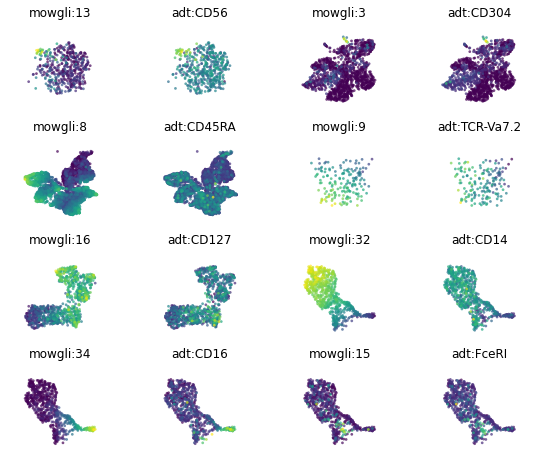

In [23]:
colors = [
    (13, "adt:CD56", "NK"),  # NK bright
    # (2, "adt:CD56", "NK"), #NK dim
    (3, "adt:CD304", "B"),  # DC
    # (7, "adt:CD71", "Eryth"), #Erythroid (pas top)
    (8, "adt:CD45RA", "CD4"),  # Naive CD4
    (9, "adt:TCR-Va7.2", "MAIT"),  # MAIT T
    # (11, "adt:CD45RA", "CD"), # Naive T
    (16, "adt:CD127", "CD8"),  # CD8 T
    # (18, "adt:CD45RO", "CD"), # TCM
    # (33, "adt:CD19", "B"), # Naive B
    # (44, "adt:IgD", "B"), # Memory B
    (32, "adt:CD14", "Mono"),  # Classical mono
    (34, "adt:CD16", "Mono"),  # Non calssical mono
    (15, "adt:FceRI", "Mono"),  # DC
    # (49, "adt:KLRG1", "CD8"), # CD8 TEM
]
fig, axes = plt.subplots(
    len(colors)//2, 2 * 2, figsize=(.8 * 6 * 2, .8 * 2.5 * len(colors)//2)#, tight_layout=True
)
for i, (dim, var, cluster) in enumerate(colors):
    idx_zoom = mdata.obs["annotation_mowgli"].str.contains(cluster)
    obsm = mdata[idx_zoom].obsm["X_umap"]
    pct = 95 if dim in [13, 9] else 99
    x1, x2 = np.percentile(obsm[:, 0], 1), np.percentile(obsm[:, 0], pct)
    y1, y2 = np.percentile(obsm[:, 1], 1), np.percentile(obsm[:, 1], pct)
    padding_x = (x2 - x1) * 0.6  if dim in [13, 9] else (x2 - x1) * 0.3
    padding_y = (y2 - y1) * 0.6  if dim in [13, 9] else (y2 - y1) * 0.3

    sc.pl.embedding(
        mdata[idx_zoom],
        basis="X_umap_mowgli",
        alpha=0.7,
        color=f"mowgli:{dim}",
        legend_fontoutline=2,
        frameon=False,
        s=30,
        ax=axes[i // 2, 2 * (i % 2) + 0],
        show=False,
    )
    axes[i // 2, 2 * (i % 2) + 0].set_xlim(x1 - padding_x, x2 + padding_x)
    axes[i // 2, 2 * (i % 2) + 0].set_ylim(y1 - padding_y, y2 + padding_y)
    fig.axes[-1].remove()
    sc.pl.embedding(
        mdata[idx_zoom],
        basis="X_umap_mowgli",
        alpha=0.7,
        color=var,
        legend_fontoutline=2,
        frameon=False,
        s=30,
        ax=axes[i // 2, 2 * (i % 2) + 1],
        show=False,
    )
    axes[i // 2, 2 * (i % 2) + 1].set_xlim(x1 - padding_x, x2 + padding_x)
    axes[i // 2, 2 * (i % 2) + 1].set_ylim(y1 - padding_y, y2 + padding_y)
    fig.axes[-1].remove()
    axes[i // 2, 2 * (i % 2) + 1].spines["top"].set_visible(False)
    axes[i // 2, 2 * (i % 2) + 1].spines["right"].set_visible(False)
plt.show()


## Plot Mowgli

In [24]:
# Load Mowgli's loadings.
H_mowgli = np.load(
    h_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()

In [25]:
H_adt = ad.AnnData(H_mowgli["H_adt"])
H_adt.X /= H_adt.X.sum(axis=1, keepdims=True)
H_adt.obs_names = mdata["adt"].var_names.str.replace("adt:", "")

H_rna = ad.AnnData(H_mowgli["H_rna"])
H_rna.X /= H_rna.X.sum(axis=1, keepdims=True)
H_rna.obs_names = mdata["rna"].var_names.str.replace("rna:", "")

H_atac = ad.AnnData(H_mowgli["H_atac"])
H_atac.X /= H_atac.X.sum(axis=1, keepdims=True)
H_atac.obs_names = mdata["atac"].var_names.str.replace("atac:", "")

In [26]:
adt_to_rna = {
    "CD10": "MME",
    "CD11b": "ITGAM",
    "CD11c": "ITGAX",
    "CD123": "IL3RA",
    "CD127": "IL7R",
    "CD14": "CD14",
    "CD141": "THBD",
    "CD16": "FCGR3A",
    "CD172a": "SIRPA",
    "CD185": "CXCR5",
    "CD19": "CD19",
    "CD192": "CCR2",
    "CD197": "CCR7",
    "CD21": "CR2",
    "CD24": "CD24",
    "CD25": "IL2RA",
    "CD269": "TNFRSF17",
    "CD27": "CD27",
    "CD278": "ICOS",
    "CD279": "PDCD1",
    "CD3": "CD3G",
    "CD304": "NRP1",
    "CD319": "SLAMF7",
    "CD38": "CD38",
    "CD39": "ENTPD1",
    "CD4": "CD4",
    "CD40": "CD40",
    "CD45RA": "PTPRC",
    "CD45RO": "PTPRC",
    "CD56": "NCAM1",
    "CD66b": "CEACAM8",
    "CD71": "TFRC",
    "CD80": "CD80",
    "CD86": "CD86",
    "CD8a": "CD8A",
    "CD95": "FAS",
    # "FceRI": "FceRI",
    "HLA-DR": "HLA-DRA",
    "IgD": "IGHD",
    # "IgG1-K-Isotype-Control": "IgG1-K-Isotype-Control",
    "IgM": "IGHM",
    "KLRG1": "KLRG1",
    # "TCR-Va24-Ja18": "TCR-Va24-Ja18",
    # "TCR-Va7.2": "TCR-Va7.2",
    # "TCR-a/b": "TCR-a/b",
    # "TCR-g/d": "TCR-g/d",
}

In [27]:
def get_tf_gene_matches(dim:int, pathway_file:str):

    list_motifs = []

    pathways = pd.read_csv(
        data_folder + "pathways/" + pathway_file,
        sep="\t",
        header=None,
        names=["gene 1", "gene 2", "weight"],
    )

    idx = np.argsort(H_rna.X[:, dim])[::-1][:20]
    top_rna = H_rna.obs_names[idx].to_list()

    idx = all_motifs["dim"] == dim
    top_motifs = all_motifs[idx].sort_values("pvalue").head(20)["motif.name"].to_list()

    for motif in top_motifs:
        idx = pathways["gene 1"].apply(lambda g: g in motif.split("::"))
        links = (
            pathways.loc[idx]
            .sort_values("weight", ascending=False)["gene 2"]
            .to_list()
        )
        if len(np.intersect1d(links, top_rna)) > 0:
            list_motifs.append(motif)
    
    return list_motifs

In [28]:
def add_stars(gene_names, cell_types, adt=False):
    updated_gene_names = []
    
    for gene_name in gene_names:
        new_gene_name = gene_name

        try:
            if adt and gene_name in adt_to_rna:
                res = pd.read_csv(f"https://www.proteinatlas.org/search/{adt_to_rna[gene_name]}?format=tsv", sep="\t")
            else:
                res = pd.read_csv(f"https://www.proteinatlas.org/search/{gene_name}?format=tsv", sep="\t")
        except HTTPError:
            res = pd.DataFrame({})

        specific = {}
        if len(res) > 0 and not pd.isna(res.loc[0, "RNA blood cell specific nTPM"]):
            for x in res.loc[0, "RNA blood cell specific nTPM"].split(";"):
                name, score = x.split(": ")
                specific[name] = float(score)
        
        for cell_type in cell_types:
            if cell_type in specific:
                new_gene_name = f"* {gene_name}"
                break
        
        updated_gene_names.append(new_gene_name)
    
    assert(len(gene_names) == len(updated_gene_names))
    return updated_gene_names

In [29]:
def plot_enrich(
    dim,
    zoom_into_cluster,
    contains,
    contains_not,
    star_cell_types,
    manual_stars=[],
    gs_stars=[],
    pathway_files=[],
    **kwargs,
):

    fig, axes = plt.subplots(2, 3, figsize=(15, 9))
    sc.pl.umap(
        mdata,
        alpha=0.7,
        color=[f"mowgli:{dim}"],
        # color="annotation_mowgli",
        legend_loc=None,
        title=f"Mowgli factor {dim}",
        legend_fontoutline=2,
        frameon=False,
        show=False,
        ax=axes[0, 0],
    )
    fig.axes[-1].remove()

    if zoom_into_cluster:
        idx_zoom = mdata.obs["annotation_mowgli"].str.contains(zoom_into_cluster)
        axins = inset_axes(
            axes[0, 0],
            "40%",
            "60%",
            borderpad=3,
            loc="upper left",
            bbox_to_anchor=(0.4, 0, 1, 1),
            bbox_transform=axes[0, 0].transAxes,
        )
        sc.pl.umap(
            mdata[idx_zoom],
            alpha=0.7,
            color=[f"mowgli:{dim}"],
            legend_loc=None,
            legend_fontoutline=2,
            vmax=mdata.obs[f"mowgli:{dim}"].max(),
            # frameon=False,
            show=False,
            ax=axins,
            **kwargs,
        )

        obsm = mdata[idx_zoom].obsm["X_umap"]
        x1, x2 = np.percentile(obsm[:, 0], 1) - 1, np.percentile(obsm[:, 0], 99) + 1.5
        y1, y2 = np.percentile(obsm[:, 1], 1) - 1, np.percentile(obsm[:, 1], 99) + 1.5
        # x1, x2, y1, y2 = 12, 18, -6, 3
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_title(None)
        axins.set_xlabel(None)
        axins.set_ylabel(None)
        axins.set_facecolor((1, 1, 1, 0.75))
        rect, lines = axes[0, 0].indicate_inset_zoom(axins)
        lines[0].set_visible(True)
        lines[1].set_visible(True)
        lines[2].set_visible(True)
        lines[3].set_visible(True)

        fig.axes[-1].remove()

    idx = np.argsort(H_rna.X[:, dim])[::-1][:20]
    names = H_rna.obs_names[idx].to_list()
    names = add_stars(names, star_cell_types)
    for name in manual_stars:
        if name in names:
            names[names.index(name)] = f"★ {name}"
    sns.barplot(
        y=names,
        x=H_rna.X[idx, dim],
        ax=axes[0, 1],
        palette="Blues_r",
    )
    axes[0, 1].set_title(f"RNA weights for factor {dim}")
    axes[0, 1].spines["top"].set_visible(False)
    axes[0, 1].spines["right"].set_visible(False)
    axes[0, 1].spines["left"].set_visible(False)

    idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
    names = H_adt.obs_names[idx].to_list()
    names = add_stars(names, star_cell_types, adt=True)
    for name in manual_stars:
        if name in names:
            names[names.index(name)] = f"★ {name}"
    sns.barplot(
        y=names,
        x=H_adt.X[idx, dim],
        ax=axes[0, 2],
        palette="Blues_r",
    )
    axes[0, 2].set_title(f"ADT weights for factor {dim}")
    axes[0, 2].spines["top"].set_visible(False)
    axes[0, 2].spines["right"].set_visible(False)
    axes[0, 2].spines["left"].set_visible(False)

    axes[1, 0].remove()

    idx_immune = enr["dim"] == dim
    idx_immune &= enr["source"] == "immune"
    for word in contains:
        idx_immune &= enr["name"].str.split("VS", expand=True)[1].str.contains(word)
    for word in contains_not:
        idx_immune &= ~(enr["name"].str.contains(word))

    idx_azimuth = enr["dim"] == dim
    idx_azimuth &= enr["source"] == "azimuth"

    idx_bp = enr["dim"] == dim
    idx_bp &= enr["source"] == "go_bp"

    idx_cc = enr["dim"] == dim
    idx_cc &= enr["source"] == "go_cc"

    idx_mf = enr["dim"] == dim
    idx_mf &= enr["source"] == "go_mf"

    idx = idx_immune | idx_azimuth | idx_bp | idx_cc | idx_mf

    df = enr[idx].sort_values("minlogp", ascending=False)

    df.loc[df["source"] == "immune", "name"] = (
        df.loc[df["source"] == "immune", "name"]
        .apply(lambda x: " ".join(x.split("_")[1:]))
        .str.replace(" DN", "  ↓")
        .str.replace(" UP", "  ↑")
        .str.replace("VS", " vs ")
    )

    df.loc[df["source"] == "azimuth", "name"] = df.loc[
        df["source"] == "azimuth", "name"
    ].str.replace(" CL[0-9]+", "", regex=True)

    df.loc[df["source"] == "go_bp", "name"] = df.loc[
        df["source"] == "go_bp", "name"
    ].str.replace(" \(GO:[0-9]+\)", "", regex=True)

    df.loc[df["source"] == "go_mf", "name"] = df.loc[
        df["source"] == "go_mf", "name"
    ].str.replace(" \(GO:[0-9]+\)", "", regex=True)

    df.loc[df["source"] == "go_cc", "name"] = df.loc[
        df["source"] == "go_cc", "name"
    ].str.replace(" \(GO:[0-9]+\)", "", regex=True)

    df = df.drop_duplicates("name").head(20)

    names = df["name"].to_list()
    for i in gs_stars:
        names[i] = f"★ {names[i]}"
    df["name"] = names

    if np.sum(idx) > 0:
        axes[1, 1].hlines(y=df["name"], xmin=0, xmax=df["minlogp"], color="lightgray")
        sns.scatterplot(
            data=df,
            x="minlogp",
            y="name",  # .apply(lambda x: x[:-13]),
            ax=axes[1, 1],
            hue="source",
            palette="tab10",
            alpha=0.85,
            estimator=max,
            ci=None,
            s=100,
            zorder=3,
        )
        axes[1, 1].set_xlabel(r"$-\log_{10}~p$")
        axes[1, 1].spines["top"].set_visible(False)
        axes[1, 1].spines["right"].set_visible(False)
        axes[1, 1].spines["left"].set_visible(False)
        axes[1, 1].set_title(f"Gene set enrichment for factor {dim}")
        axes[1, 1].set_ylabel(None)
    else:
        axes[1, 1].remove()

    idx = all_motifs["dim"] == dim
    df = (
        all_motifs[idx]
        .copy()
        .sort_values("pvalue", ascending=True)
        .drop_duplicates("motif.name")
        .head(20)
    )
    for pathway_file in pathway_files:
        list_motifs = get_tf_gene_matches(dim, pathway_file)
        for motif in list_motifs:
            df.loc[df["motif.name"] == motif, "motif.name"] = f"★ {motif}"
    if np.sum(idx) > 0:
        axes[1, 2].hlines(
            y=df["motif.name"], xmin=0, xmax=df["minlogp"], color="lightgray"
        )
        sns.scatterplot(
            data=df,
            y="motif.name",
            x="minlogp",
            ax=axes[1, 2],
            palette="Blues_r",
            s=100,
            zorder=3,
        )
        axes[1, 2].set_xlabel(r"$-\log_{10}~p$")
        axes[1, 2].spines["top"].set_visible(False)
        axes[1, 2].spines["right"].set_visible(False)
        axes[1, 2].spines["left"].set_visible(False)
        axes[1, 2].set_title(f"Motif enrichment for factor {dim}")
        axes[1, 2].set_ylabel(None)
    else:
        axes[1, 2].remove()

    plt.savefig(fig_folder + "CD8_effector_memory.pdf", bbox_inches="tight")
    plt.show()


In [30]:
gene_sets = {}
with open("/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/gmts/go_bp.gmt") as f:
    for line in f.readlines():
        tokens = line.split("\t")
        gene_sets[tokens[0]] = tokens[2:]

In [31]:
monocyte_markers = ["CTSS", "FCN1", "NEAT1", "LYZ", "PSAP", "S100A9", "AIF1", "MNDA", "SERPINA1", "TYROBP"]
CD14_monocyte_markers = ["S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A12", "IL1B", "CD14", "G0S2", "FCN1"]
CD16_monocyte_markers = ["CDKN1C", "FCGR3A", "PTPRC", "LST1", "IER5", "MS4A7", "RHOC", "IFITM3", "AIF1", "HES4"]
CD4_markers = ["IL7R", "MAL", "LTB", "CD4", "LDHB", "TPT1", "TRAC", "TMSB10", "CD3D", "CD3G"]
CD8_markers = ["CD8B", "CD8A", "CD3D", "TMSB10", "HCST", "CD3G", "LINC02446", "CTSW", "CD3E", "TRAC"]
CD8_naive_markers = ["CD8B", "S100B", "CCR7", "RGS10", "NOSIP", "LINC02446", "LEF1", "CRTAM", "CD8A", "OXNAD1"]
CD4_naive_markers = ["TCF7", "CD4", "CCR7", "IL7R", "FHIT", "LEF1", "MAL", "NOSIP", "LDHB", "PIK3IP1"]
CD8_TCM_markers = ["CD8B", "ANXA1", "CD8A", "KRT1", "LINC02446", "YBX3", "IL7R", "TRAC", "NELL2", "LDHB"]
CD4_TCM_markers = ["IL7R", "TMSB10", "CD4", "ITGB1", "LTB", "TRAC", "AQP3", "LDHB", "IL32", "MAL"]
CD8_TEM_markers = ["CCL5", "GZMH", "CD8A", "TRAC", "KLRD1", "NKG7", "GZMK", "CST7", "CD8B", "TRGC2"]
CD4_TEM_markers = ["IL7R", "CCL5", "FYB1", "GZMK", "IL32", "GZMA", "KLRB1", "TRAC", "LTB", "AQP3"]
NK_markers = ["NKG7", "KLRD1", "TYROBP", "GNLY", "FCER1G", "PRF1", "CD247", "KLRF1", "CST7", "GZMB"]
NK_dim_markers = ["GNLY", "TYROBP", "NKG7", "FCER1G", "GZMB", "TRDC", "PRF1", "FGFBP2", "SPON2", "KLRF1"]
NK_bright_markers = ["XCL2", "FCER1G", "SPINK2", "TRDC", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A"]
B_markers = ["CD79A", "RALGPS2", "CD79B", "MS4A1", "BANK1", "CD74", "TNFRSF13C", "HLA-DQA1", "IGHM", "MEF2C"]
B_naive_markers = ["IGHM", "IGHD", "CD79A", "IL4R", "MS4A1", "CXCR4", "BTG1", "TCL1A", "CD79B", "YBX3"]
B_memory_markers = ["MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C", "LINC01781"]
other_T_markers = ["CD3D", "TRDC", "GZMK", "KLRB1", "NKG7", "TRGC2", "CST7", "LYAR", "KLRG1", "GZMA"]
DC_markers = ["CD74", "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "CCDC88A", "HLA-DRA", "HLA-DMA", "CST3", "HLA-DQB1", "HLA-DRB1"]


Naive and memory CD8 T cells


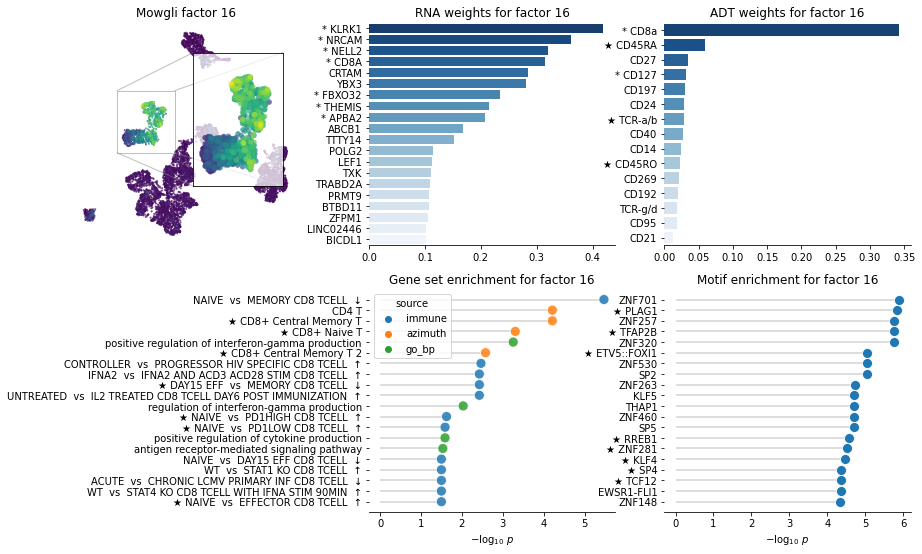

In [32]:
# Naive and memory CD8 T cells
print("\nNaive and memory CD8 T cells")
plot_enrich(
    dim=16,
    zoom_into_cluster="CD8",
    contains=["CD8"],
    contains_not=["CD4", "BCELL", "DC", "MONO"],
    star_cell_types=["naive CD8 T-cell", "memory CD8 T-cell"],
    manual_stars=[
        "CD45RO",  # Because memory
        "CD45RA",  # Because naive
        "TCR-a/b",  # Because CD8 T cell
    ],
    gs_stars=[
        2,
        3,
        5,
        8,
        11,
        12,
        19,
    ],
    pathway_files=["cd8+_t_cells.txt.gz"],
)



Effector Memory CD8 T cells


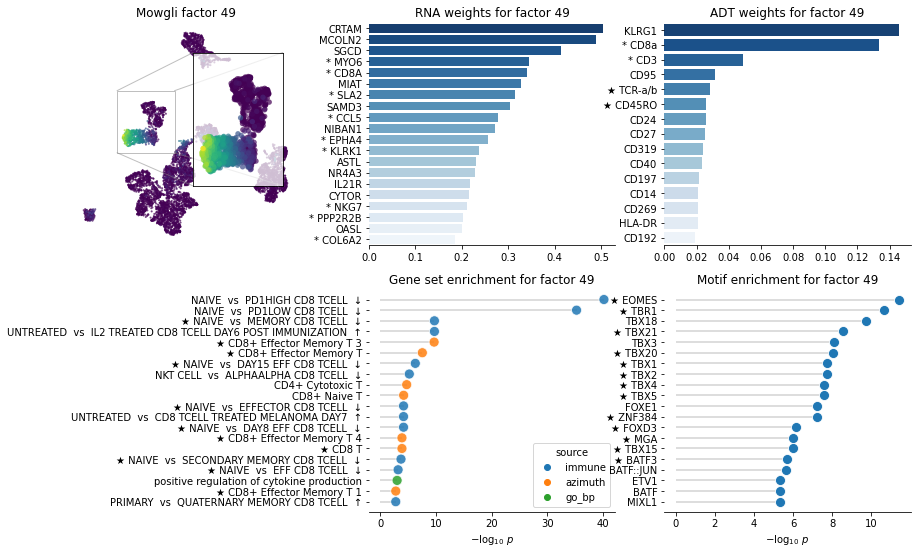

In [33]:
# Effector Memory CD8 T cells
print("\nEffector Memory CD8 T cells")
plot_enrich(
    dim=49,
    zoom_into_cluster="CD8",
    contains=["CD8"],
    contains_not=["CD4", "BCELL", "DC", "MONO"],
    star_cell_types=["memory CD8 T-cell"],
    manual_stars=[
        "CD45RO",  # Because memory
        "TCR-a/b",  # Because CD8 T cell
    ],
    gs_stars=[
        2,
        4,
        5,
        6,
        10,
        12,
        13,
        14,
        15,
        16,
        18,
    ],
    pathway_files=["cd8+_t_cells.txt.gz"],
)

In [34]:
dim = 33
idx = np.argsort(H_rna.X[:, dim])[::-1][:20]
names = H_rna.obs_names[idx].to_list()
print("\n- ".join(add_stars(names, ["naive B-cell"])))

* STEAP1B
- * PTPRK
- ST6GALNAC3
- SDK2
- LIX1-AS1
- * RASGRP3
- * C12orf42
- * LARGE1
- * FCER2
- * ABCB4
- * BCL11A
- IFNG-AS1
- AC120193.1
- TPST1
- ACSM3
- * MARCH1
- * KHDRBS2
- * PCDH9
- AGPAT5
- AL050309.1



Stem Memory / Central Memory T cells


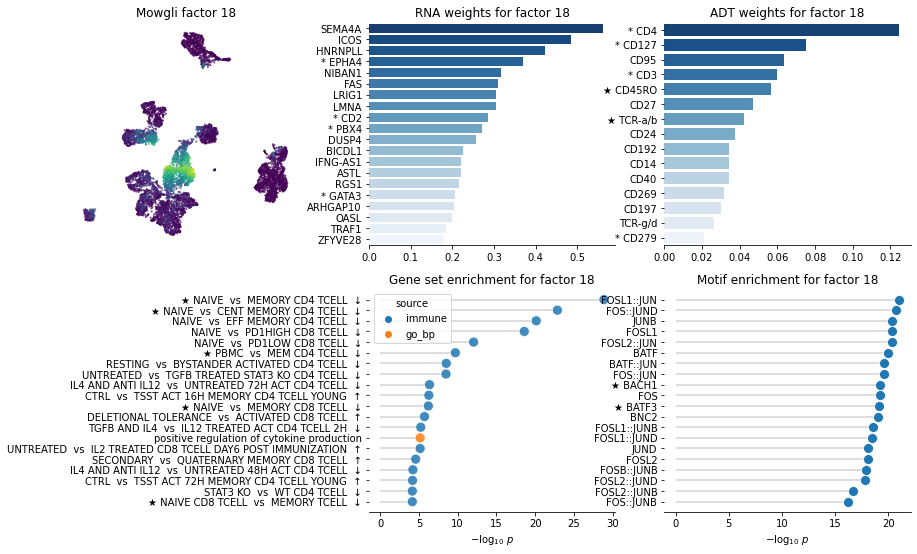

In [35]:
# Stem Memory / Central Memory T cells
print("\nStem Memory / Central Memory T cells")
plot_enrich(
    dim=18,
    zoom_into_cluster=None,
    contains=["TCELL"],
    contains_not=["BCELL", "DC", "MONO"],
    star_cell_types=["memory CD4 T-cell", "memory CD8 T-cell"],
    manual_stars=[
        "CD45RO",  # Because memory
        "TCR-a/b",  # Because CD8/CD4 T cell
    ],
    gs_stars=[
        0,
        1,
        5,
        10,
        19,
    ],
    pathway_files=["cd8+_t_cells.txt.gz", "cd4+_t_cells.txt.gz"],
)



Naive T cells


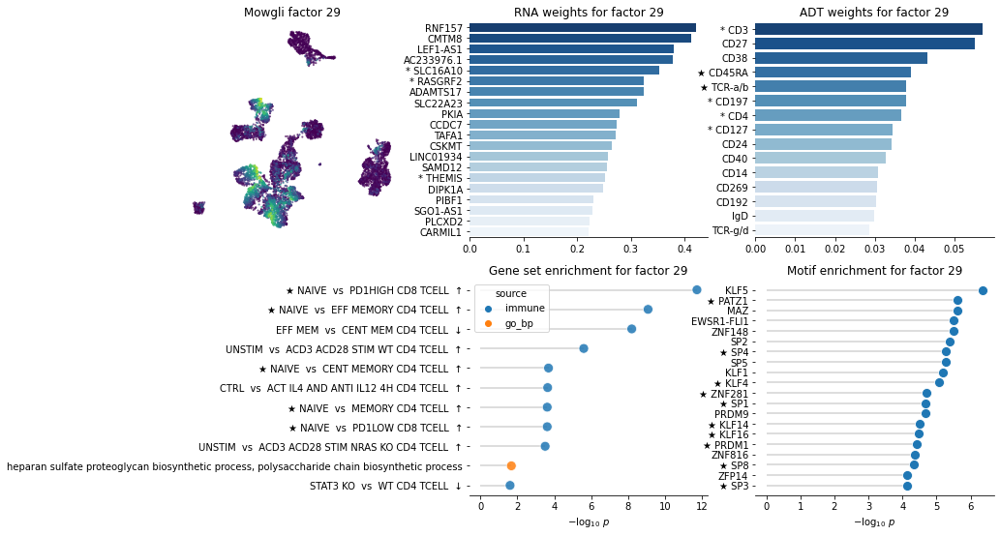

In [36]:
# Naive T cells
print("\nNaive T cells")
plot_enrich(
    dim=29,
    zoom_into_cluster=None,
    contains=["TCELL"],
    contains_not=["BCELL", "DC", "MONO"],
    star_cell_types=["naive CD4 T-cell", "naive CD8 T-cell"],
    manual_stars=[
        "CD45RA",  # Because naive
        "TCR-a/b",  # Because CD8/CD4 T cell
    ],
    gs_stars=[
        0,
        1,
        4,
        6,
        7,
    ],
    pathway_files=["cd8+_t_cells.txt.gz", "cd4+_t_cells.txt.gz"],
)



Naive CD4 T cells


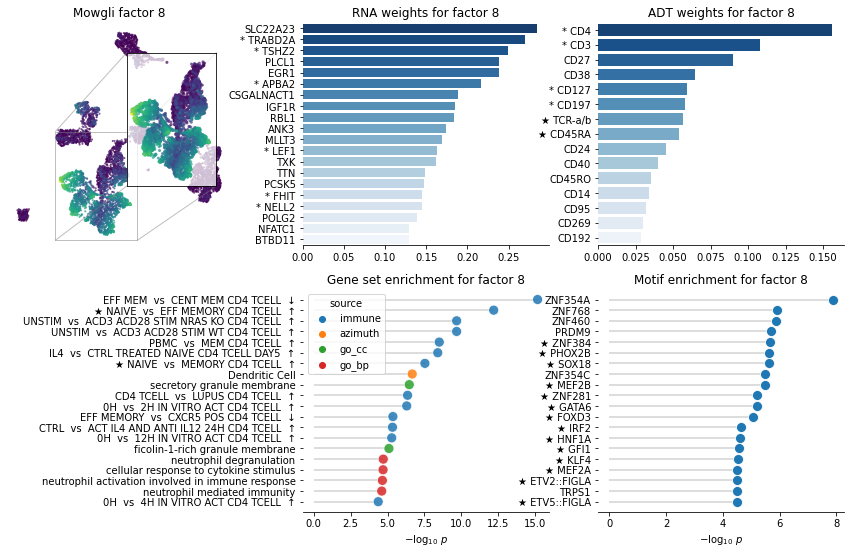

In [37]:
# Naive CD4 T cells
print("\nNaive CD4 T cells")
plot_enrich(
    dim=8,
    zoom_into_cluster="CD4",
    contains=["CD4"],
    contains_not=["CD8", "BCELL", "DC", "MONO"],
    star_cell_types=["naive CD4 T-cell"],
    manual_stars=[
        "CD45RA",  # Because naive
        "TCR-a/b",  # Because CD4 T cell
    ],
    gs_stars=[
        1,
        6,
        
    ],
    pathway_files=["cd4+_t_cells.txt.gz"],
)



Memory B cells


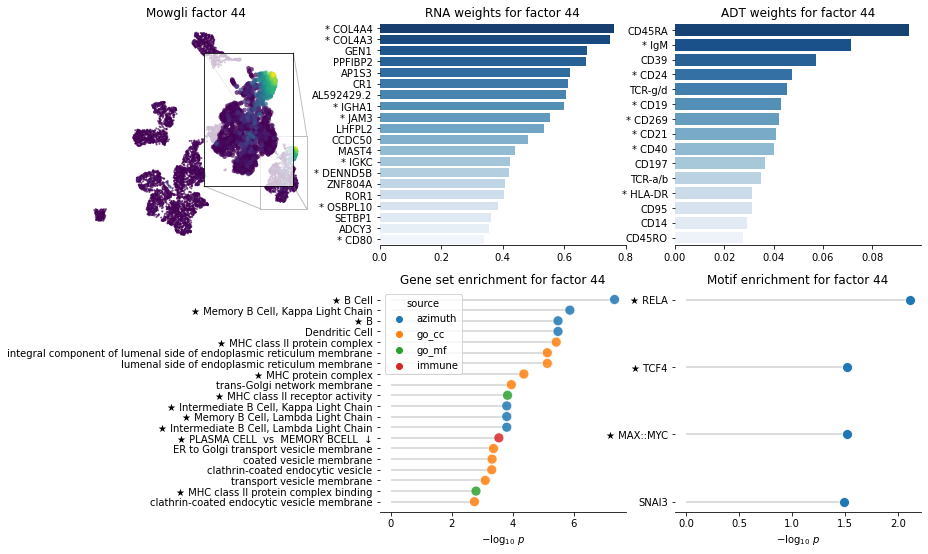

In [38]:
# Memory B cells
print("\nMemory B cells")
plot_enrich(
    44,
    contains=["BCELL"],
    zoom_into_cluster="B",
    contains_not=["TCELL", "DC", "MONO"],
    star_cell_types=["memory B-cell"],
    pathway_files=["cd19+_b_cells.txt.gz"],
    gs_stars=[
        0,
        1,
        2,
        4,
        7,
        9,
        10,
        11,
        12,
        13,
        18
    ],
)



Naive B cells


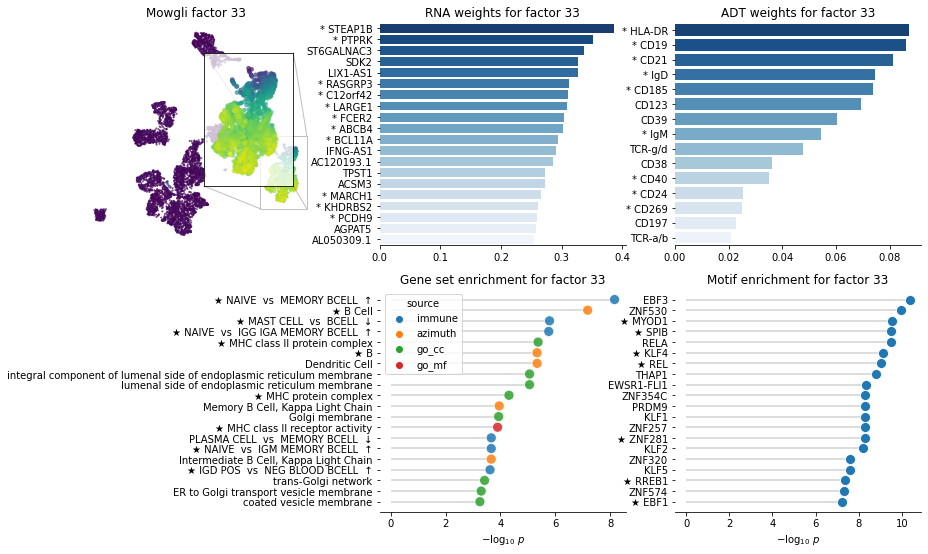

In [39]:
# Naive B cells
print("\nNaive B cells")
plot_enrich(
    33,
    contains=["BCELL"],
    zoom_into_cluster="B",
    contains_not=["TCELL", "DC", "MONO"],
    star_cell_types=["naive B-cell"],
    pathway_files=["cd19+_b_cells.txt.gz"],
    gs_stars=[
        0,
        1,
        2,
        3,
        4,
        5,
        9,
        12,
        14,
        16,
    ],
)


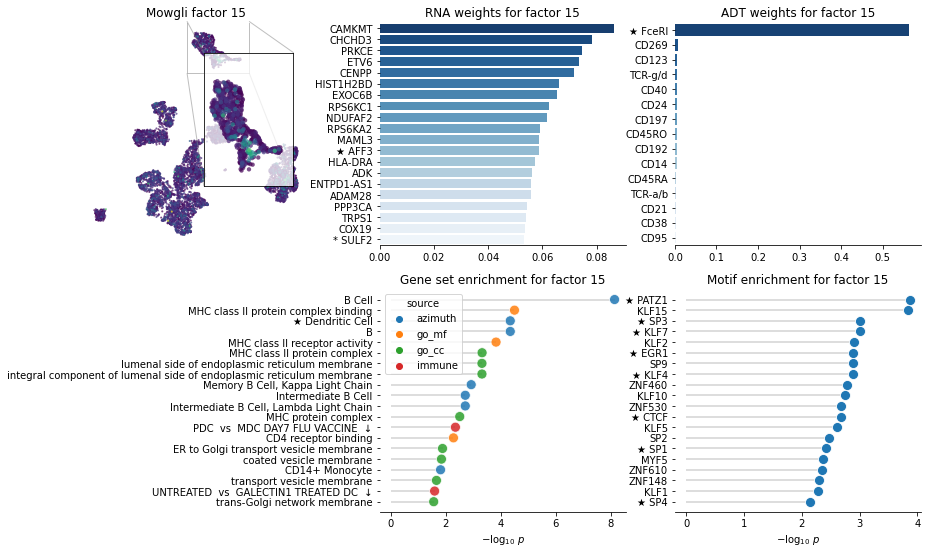

In [40]:
# Dendritic cells
# plot_enrich(
#     dim=3,
#     zoom_into_cluster="B cells",
#     contains=["DC"],
#     contains_not=["TCELL", "BCELL", "MONO"],
#     star_cell_types=["myeloid DC"], #"plasmacytoid DC"
#     manual_stars=[
#         "CD304",
#     ],
#     s=75,
#     pathway_file="dendritic_cells_-_plasmacytoid.txt.gz",
# )

plot_enrich(
    dim=15,
    zoom_into_cluster="Monocytes",
    contains=["DC"],
    contains_not=["TCELL", "BCELL", "MONO"],
    star_cell_types=["myeloid DC"], #"plasmacytoid DC"
    manual_stars=[
        "FceRI",
        "FCER1A",
        "HLA-DQA1",
        "CLEC10A",
        "CD1C",
        "ENHO",
        "PLD4",
        "GSN",
        "SLC38A1",
        "NDRG2",
        "AFF3",
    ],
    s=75,
    gs_stars=[2],
    pathway_files=["dendritic_cells_-_plasmacytoid.txt.gz"],
)

# plot_enrich(
#     dim=25,
#     zoom_into_cluster="B cells",
#     contains=["DC"],
#     contains_not=["TCELL", "BCELL", "MONO"],
#     star_cell_types=["myeloid DC"], #"plasmacytoid DC"
#     manual_stars=[
#         "CD141",
#     ],
#     s=75,
#     pathway_file="dendritic_cells_-_plasmacytoid.txt.gz",
# )


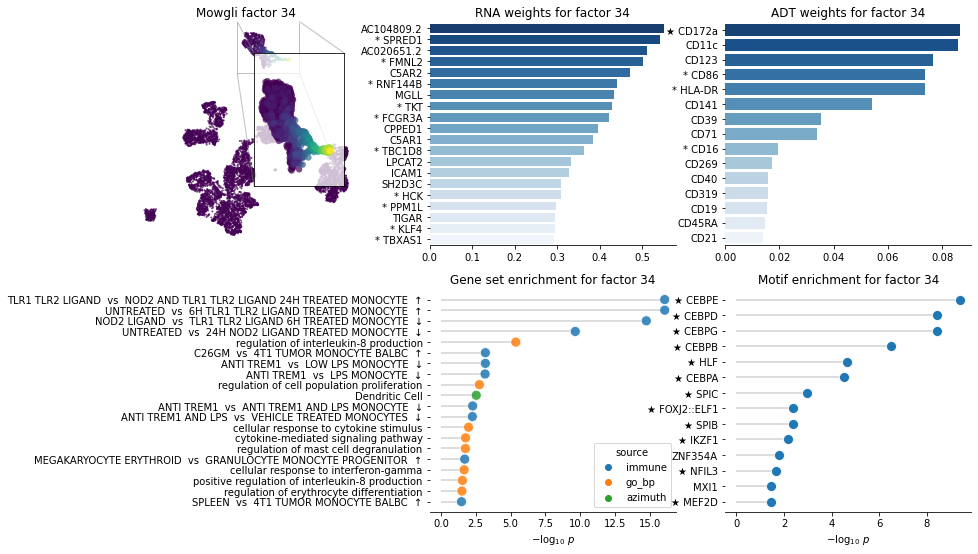

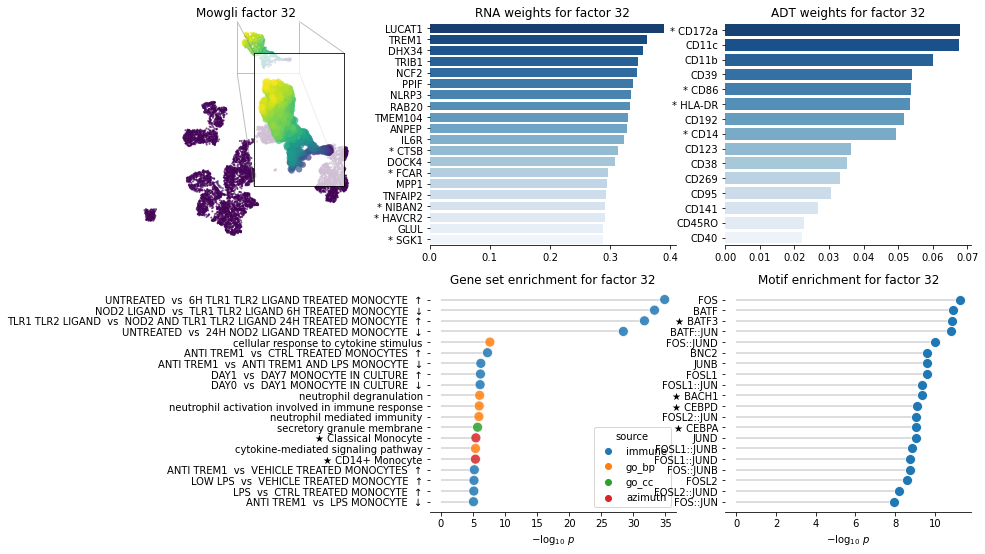

In [41]:
# Monocytes
# plot_enrich(
#     23,
#     zoom_into_cluster="Monocytes",
#     contains=["MONO"],
#     contains_not=["TCELL", "BCELL", "DC"],
#     star_cell_types=["non-classical monocyte"],
#     manual_stars=[
#         "CD172a",  # higher in non-classical! https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5406034/
#     ],
#     pathway_files=["cd14+cd16+_monocytes.txt.gz"],
# )
plot_enrich(
    34,
    zoom_into_cluster="Monocytes",
    contains=["MONO"],
    contains_not=["TCELL", "BCELL", "DC"],
    star_cell_types=["non-classical monocyte"],
    manual_stars=[
        "CD172a",  # higher in non-classical! https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5406034/
    ],
    pathway_files=["cd14+cd16+_monocytes.txt.gz"],
)
plot_enrich(
    32,
    zoom_into_cluster="Monocytes",
    contains=["MONO"],
    contains_not=["TCELL", "BCELL", "DC"],
    star_cell_types=["classical monocyte"],
    gs_stars=[
        13,
        15,
    ],
    pathway_files=["cd14+cd16-_monocytes.txt.gz"],
)


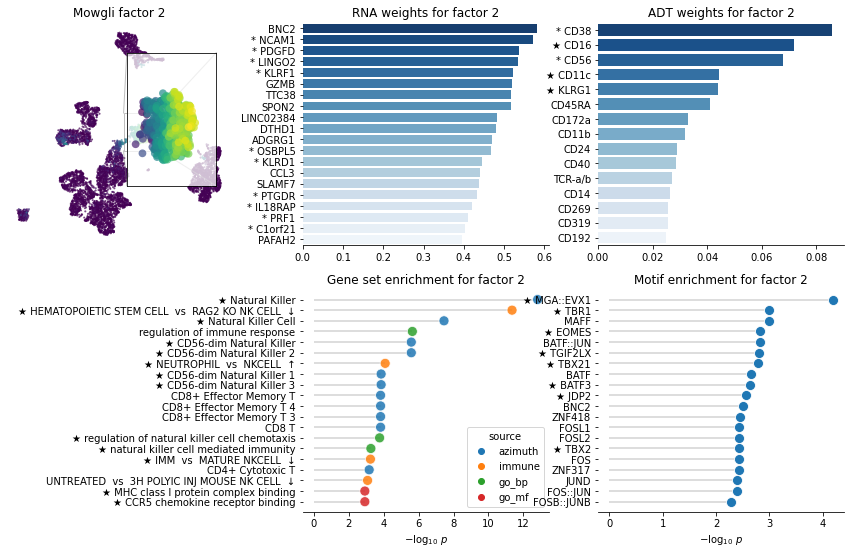

In [42]:
plot_enrich(
    2,
    zoom_into_cluster="NK cells",
    contains=["NK"],
    contains_not=["TCELL", "BCELL", "MONO", "DC"],
    star_cell_types=["NK-cell"],
    manual_stars=[
        "CD11c",
        "KLRG1",
        "CD16",
    ],
    gs_stars=[
        0,
        1,
        2,
        4,
        5,
        6,
        7,
        8,
        13,
        14,
        15,
        18,
        19,
    ],
    pathway_files=["natural_killer_cells.txt.gz"],
)


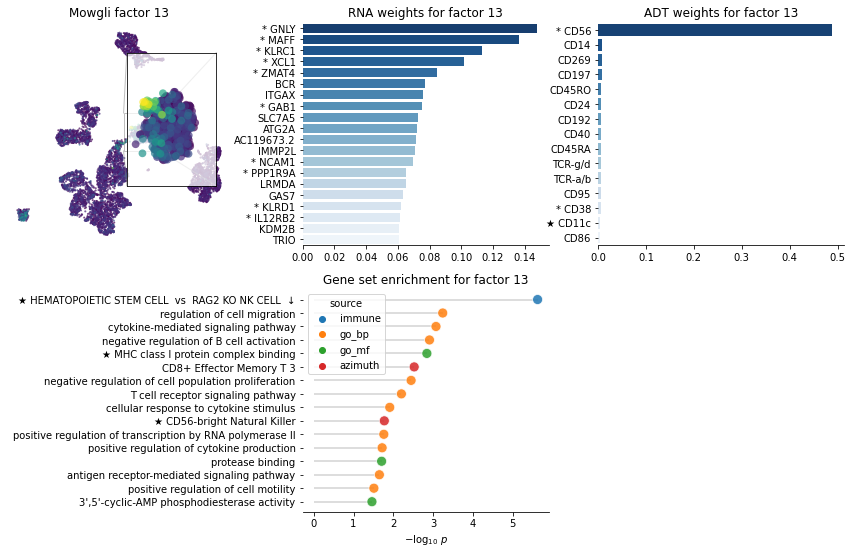

In [43]:
plot_enrich(
    13,
    zoom_into_cluster="NK cells",
    contains=["NK"],
    contains_not=["TCELL", "BCELL", "MONO", "DC"],
    star_cell_types=["NK-cell"],
    manual_stars=[
        "CD11c",
        "KLRG1",
    ],
    gs_stars=[
        0,
        4,
        9,
    ],
    pathway_files=["natural_killer_cells.txt.gz"],
)

## Biiig plot

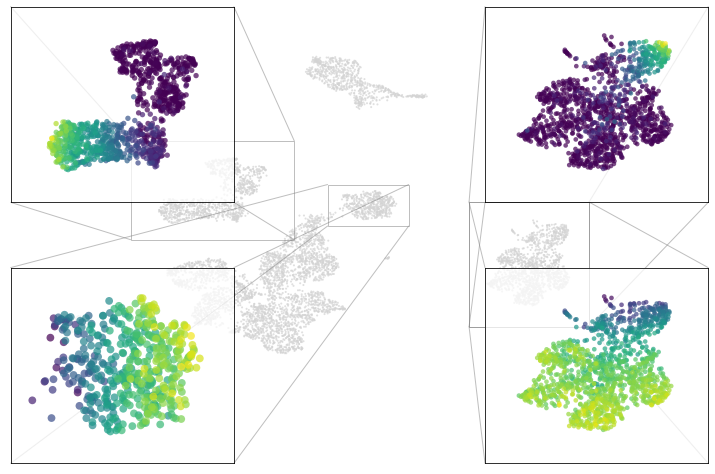

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
sc.pl.umap(
    mdata,
    alpha=0.7,
    # color=[f"mowgli:{dim}"],
    # color="annotation_mowgli",
    legend_loc=None,
    # title=f"Mowgli factor {dim}",
    legend_fontoutline=2,
    frameon=False,
    show=False,
    ax=ax,
)
# fig.axes[-1].remove()

idx_zoom = mdata.obs["annotation_mowgli"].str.contains("NK")
axins_1 = inset_axes(
    ax,
    "40%",
    "60%",
    borderpad=3,
    loc="upper left",
    bbox_to_anchor=(-.1, -.6, 1, 1),
    bbox_transform=ax.transAxes,
)
sc.pl.umap(
    mdata[idx_zoom],
    alpha=0.7,
    color=["mowgli:2"],
    legend_loc=None,
    legend_fontoutline=2,
    vmax=mdata.obs["mowgli:2"].max(),
    # frameon=False,
    show=False,
    ax=axins_1,
)

obsm = mdata[idx_zoom].obsm["X_umap"]
x1, x2 = np.percentile(obsm[:, 0], 1), np.percentile(obsm[:, 0], 99)
y1, y2 = np.percentile(obsm[:, 1], 1), np.percentile(obsm[:, 1], 99)
padding_x = (x2 - x1) * 0.3
padding_y = (y2 - y1) * 0.3
axins_1.set_xlim(x1 - padding_x, x2 + padding_x)
axins_1.set_ylim(y1 - padding_y, y2 + padding_y)
axins_1.set_title(None)
axins_1.set_xlabel(None)
axins_1.set_ylabel(None)
axins_1.set_facecolor((1, 1, 1, 0.75))
rect, lines = ax.indicate_inset_zoom(axins_1)
lines[0].set_visible(True)
lines[1].set_visible(True)
lines[2].set_visible(True)
lines[3].set_visible(True)

fig.axes[-1].remove()

idx_zoom = mdata.obs["annotation_mowgli"].str.contains("B")
axins_2 = inset_axes(
    ax,
    "40%",
    "60%",
    borderpad=3,
    loc="upper left",
    bbox_to_anchor=(.75, -.6, 1, 1),
    bbox_transform=ax.transAxes,
)
sc.pl.umap(
    mdata[idx_zoom],
    alpha=0.7,
    color=["mowgli:33"],
    legend_loc=None,
    legend_fontoutline=2,
    vmax=mdata.obs["mowgli:33"].max(),
    # frameon=False,
    show=False,
    ax=axins_2,
)

obsm = mdata[idx_zoom].obsm["X_umap"]
x1, x2 = np.percentile(obsm[:, 0], 1), np.percentile(obsm[:, 0], 99)
y1, y2 = np.percentile(obsm[:, 1], 1), np.percentile(obsm[:, 1], 99)
padding_x = (x2 - x1) * 0.3
padding_y = (y2 - y1) * 0.3
axins_2.set_xlim(x1 - padding_x, x2 + padding_x)
axins_2.set_ylim(y1 - padding_y, y2 + padding_y)
axins_2.set_title(None)
axins_2.set_xlabel(None)
axins_2.set_ylabel(None)
axins_2.set_facecolor((1, 1, 1, 0.75))
rect, lines = ax.indicate_inset_zoom(axins_2)
lines[0].set_visible(True)
lines[1].set_visible(True)
lines[2].set_visible(True)
lines[3].set_visible(True)

fig.axes[-1].remove()

idx_zoom = mdata.obs["annotation_mowgli"].str.contains("B")
axins_3 = inset_axes(
    ax,
    "40%",
    "60%",
    borderpad=3,
    loc="upper left",
    bbox_to_anchor=(.75, .2, 1, 1),
    bbox_transform=ax.transAxes,
)
sc.pl.umap(
    mdata[idx_zoom],
    alpha=0.7,
    color=["mowgli:44"],
    legend_loc=None,
    legend_fontoutline=2,
    vmax=mdata.obs["mowgli:44"].max(),
    # frameon=False,
    show=False,
    ax=axins_3,
)

obsm = mdata[idx_zoom].obsm["X_umap"]
x1, x2 = np.percentile(obsm[:, 0], 1), np.percentile(obsm[:, 0], 99)
y1, y2 = np.percentile(obsm[:, 1], 1), np.percentile(obsm[:, 1], 99)
padding_x = (x2 - x1) * 0.3
padding_y = (y2 - y1) * 0.3
axins_3.set_xlim(x1 - padding_x, x2 + padding_x)
axins_3.set_ylim(y1 - padding_y, y2 + padding_y)
axins_3.set_title(None)
axins_3.set_xlabel(None)
axins_3.set_ylabel(None)
axins_3.set_facecolor((1, 1, 1, 0.75))
rect, lines = ax.indicate_inset_zoom(axins_3)
lines[0].set_visible(True)
lines[1].set_visible(True)
lines[2].set_visible(True)
lines[3].set_visible(True)

fig.axes[-1].remove()

idx_zoom = mdata.obs["annotation_mowgli"].str.contains("CD8")
axins_4 = inset_axes(
    ax,
    "40%",
    "60%",
    borderpad=3,
    loc="upper left",
    bbox_to_anchor=(-.1, .2, 1, 1),
    bbox_transform=ax.transAxes,
)
sc.pl.umap(
    mdata[idx_zoom],
    alpha=0.7,
    color=["mowgli:49"],
    legend_loc=None,
    legend_fontoutline=2,
    vmax=mdata.obs["mowgli:49"].max(),
    # frameon=False,
    show=False,
    ax=axins_4,
)

obsm = mdata[idx_zoom].obsm["X_umap"]
x1, x2 = np.percentile(obsm[:, 0], 1), np.percentile(obsm[:, 0], 99)
y1, y2 = np.percentile(obsm[:, 1], 1), np.percentile(obsm[:, 1], 99)
padding_x = (x2 - x1) * 0.3
padding_y = (y2 - y1) * 0.3
axins_4.set_xlim(x1 - padding_x, x2 + padding_x)
axins_4.set_ylim(y1 - padding_y, y2 + padding_y)
axins_4.set_title(None)
axins_4.set_xlabel(None)
axins_4.set_ylabel(None)
axins_4.set_facecolor((1, 1, 1, 0.75))
rect, lines = ax.indicate_inset_zoom(axins_4)
lines[0].set_visible(True)
lines[1].set_visible(True)
lines[2].set_visible(True)
lines[3].set_visible(True)

fig.axes[-1].remove()

<ipython-input-45-606f31a0a4b9>:120: UserWarning:

FixedFormatter should only be used together with FixedLocator



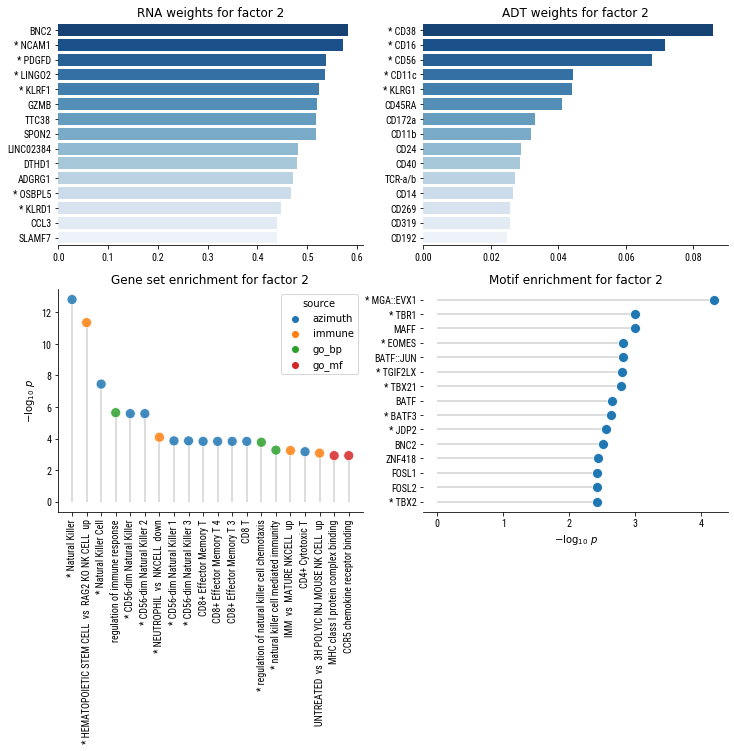

In [45]:
dim = 2
zoom_into_cluster = "NK cells"
contains = ["NK"]
contains_not = ["TCELL", "BCELL", "MONO", "DC"]
star_cell_types = ["NK-cell"]
manual_stars = ["CD11c", "KLRG1", "CD16"]
gs_stars = [0, 1, 2, 4, 5, 6, 7, 8, 13, 14]  # , 15, 18, 19]
pathway_files = ["natural_killer_cells.txt.gz"]

fig, axes = plt.subplots(2, 2, figsize=(12, 9))#, constrained_layout=True)

idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
names = H_rna.obs_names[idx].to_list()
names = add_stars(names, star_cell_types)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"* {name}"
sns.barplot(
    y=names,
    x=H_rna.X[idx, dim],
    ax=axes[0, 0],
    palette="Blues_r",
)
axes[0, 0].set_title(f"RNA weights for factor {dim}")
axes[0, 0].spines["top"].set_visible(False)
axes[0, 0].spines["right"].set_visible(False)
axes[0, 0].spines["left"].set_visible(False)

idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
names = H_adt.obs_names[idx].to_list()
names = add_stars(names, star_cell_types, adt=True)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"* {name}"
sns.barplot(
    y=names,
    x=H_adt.X[idx, dim],
    ax=axes[0, 1],
    palette="Blues_r",
)
axes[0, 1].set_title(f"ADT weights for factor {dim}")
axes[0, 1].spines["top"].set_visible(False)
axes[0, 1].spines["right"].set_visible(False)
axes[0, 1].spines["left"].set_visible(False)

idx_immune = enr["dim"] == dim
idx_immune &= enr["source"] == "immune"
for word in contains:
    idx_immune &= enr["name"].str.split("VS", expand=True)[1].str.contains(word)
for word in contains_not:
    idx_immune &= ~(enr["name"].str.contains(word))

idx_azimuth = enr["dim"] == dim
idx_azimuth &= enr["source"] == "azimuth"

idx_bp = enr["dim"] == dim
idx_bp &= enr["source"] == "go_bp"

idx_cc = enr["dim"] == dim
idx_cc &= enr["source"] == "go_cc"

idx_mf = enr["dim"] == dim
idx_mf &= enr["source"] == "go_mf"

idx = idx_immune | idx_azimuth | idx_bp | idx_cc | idx_mf

df = enr[idx].sort_values("minlogp", ascending=False)

df.loc[df["source"] == "immune", "name"] = (
    df.loc[df["source"] == "immune", "name"]
    .apply(lambda x: " ".join(x.split("_")[1:]))
    .str.replace(" DN", "  up")
    .str.replace(" UP", "  down")
    .str.replace("VS", " vs ")
)

df.loc[df["source"] == "azimuth", "name"] = df.loc[
    df["source"] == "azimuth", "name"
].str.replace(" CL[0-9]+", "", regex=True)

df.loc[df["source"] == "go_bp", "name"] = df.loc[
    df["source"] == "go_bp", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_mf", "name"] = df.loc[
    df["source"] == "go_mf", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_cc", "name"] = df.loc[
    df["source"] == "go_cc", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df = df.drop_duplicates("name").head(20)

names = df["name"].to_list()
for i in gs_stars:
    names[i] = f"* {names[i]}"
df["name"] = names

if np.sum(idx) > 0:
    axes[1, 0].vlines(x=df["name"], ymin=0, ymax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        y="minlogp",
        x="name",  # .apply(lambda x: x[:-13]),
        ax=axes[1, 0],
        hue="source",
        palette="tab10",
        alpha=0.85,
        estimator=max,
        ci=None,
        s=100,
        zorder=3,
    )
    axes[1, 0].set_ylabel(r"$-\log_{10}~p$")
    axes[1, 0].spines["top"].set_visible(False)
    axes[1, 0].spines["right"].set_visible(False)
    axes[1, 0].set_title(f"Gene set enrichment for factor {dim}")
    axes[1, 0].set_xlabel(None)
    axes[1, 0].set_xticklabels(names, rotation=90)
else:
    axes[1, 0].remove()

idx = all_motifs["dim"] == dim
df = (
    all_motifs[idx]
    .copy()
    .sort_values("pvalue", ascending=True)
    .drop_duplicates("motif.name")
    .head(15)
)
for pathway_file in pathway_files:
    list_motifs = get_tf_gene_matches(dim, pathway_file)
    for motif in list_motifs:
        df.loc[df["motif.name"] == motif, "motif.name"] = f"* {motif}"
if np.sum(idx) > 0:
    axes[1, 1].hlines(y=df["motif.name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        y="motif.name",
        x="minlogp",
        ax=axes[1, 1],
        palette="Blues_r",
        s=100,
        zorder=3,
    )
    axes[1, 1].set_xlabel(r"$-\log_{10}~p$")
    axes[1, 1].spines["top"].set_visible(False)
    axes[1, 1].spines["right"].set_visible(False)
    axes[1, 1].spines["left"].set_visible(False)
    axes[1, 1].set_title(f"Motif enrichment for factor {dim}")
    axes[1, 1].set_ylabel(None)
else:
    axes[1, 1].remove()

for ax in fig.axes:
    for tick in ax.get_yticklabels():
        tick.set_fontname("Roboto Condensed")
    for tick in ax.get_xticklabels():
        tick.set_fontname("Roboto Condensed")

plt.show()


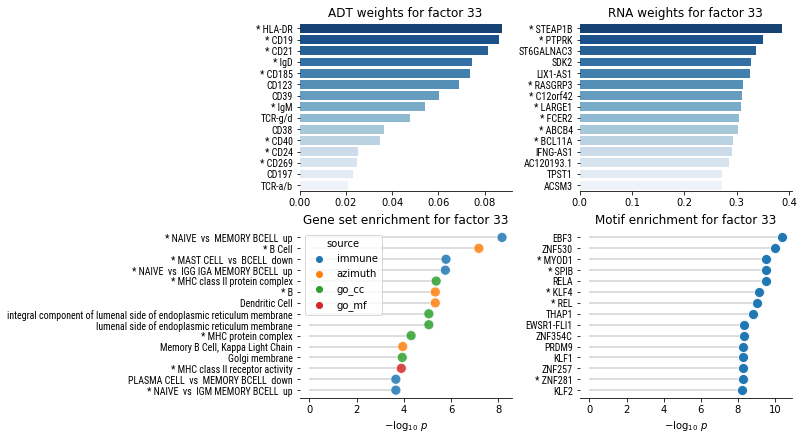

In [46]:
dim = 33
contains = ["BCELL"]
zoom_into_cluster = "B"
contains_not = ["TCELL", "DC", "MONO"]
star_cell_types = ["naive B-cell"]
pathway_files = ["cd19+_b_cells.txt.gz"]
gs_stars = [0, 1, 2, 3, 4, 5, 9, 12, 14]#, 16]

fig, axes = plt.subplots(2, 3, figsize=(14, 6), constrained_layout=True)

idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
names = H_rna.obs_names[idx].to_list()
names = add_stars(names, star_cell_types)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"* {name}"
sns.barplot(
    y=names,
    x=H_rna.X[idx, dim],
    ax=axes[0, 2],
    palette="Blues_r",
)
axes[0, 2].set_title(f"RNA weights for factor {dim}")
axes[0, 2].spines["top"].set_visible(False)
axes[0, 2].spines["right"].set_visible(False)
axes[0, 2].spines["left"].set_visible(False)

idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
names = H_adt.obs_names[idx].to_list()
names = add_stars(names, star_cell_types, adt=True)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"* {name}"
sns.barplot(
    y=names,
    x=H_adt.X[idx, dim],
    ax=axes[0, 1],
    palette="Blues_r",
)
axes[0, 1].set_title(f"ADT weights for factor {dim}")
axes[0, 1].spines["top"].set_visible(False)
axes[0, 1].spines["right"].set_visible(False)
axes[0, 1].spines["left"].set_visible(False)

axes[1, 0].remove()

idx_immune = enr["dim"] == dim
idx_immune &= enr["source"] == "immune"
for word in contains:
    idx_immune &= enr["name"].str.split("VS", expand=True)[1].str.contains(word)
for word in contains_not:
    idx_immune &= ~(enr["name"].str.contains(word))

idx_azimuth = enr["dim"] == dim
idx_azimuth &= enr["source"] == "azimuth"

idx_bp = enr["dim"] == dim
idx_bp &= enr["source"] == "go_bp"

idx_cc = enr["dim"] == dim
idx_cc &= enr["source"] == "go_cc"

idx_mf = enr["dim"] == dim
idx_mf &= enr["source"] == "go_mf"

idx = idx_immune | idx_azimuth | idx_bp | idx_cc | idx_mf

df = enr[idx].sort_values("minlogp", ascending=False)

df.loc[df["source"] == "immune", "name"] = (
    df.loc[df["source"] == "immune", "name"]
    .apply(lambda x: " ".join(x.split("_")[1:]))
    .str.replace(" DN", "  down")
    .str.replace(" UP", "  up")
    .str.replace("VS", " vs ")
)

df.loc[df["source"] == "azimuth", "name"] = df.loc[
    df["source"] == "azimuth", "name"
].str.replace(" CL[0-9]+", "", regex=True)

df.loc[df["source"] == "go_bp", "name"] = df.loc[
    df["source"] == "go_bp", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_mf", "name"] = df.loc[
    df["source"] == "go_mf", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_cc", "name"] = df.loc[
    df["source"] == "go_cc", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df = df.drop_duplicates("name").head(15)

names = df["name"].to_list()
for i in gs_stars:
    names[i] = f"* {names[i]}"
df["name"] = names

if np.sum(idx) > 0:
    axes[1, 1].hlines(y=df["name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        x="minlogp",
        y="name",  # .apply(lambda x: x[:-13]),
        ax=axes[1, 1],
        hue="source",
        palette="tab10",
        alpha=0.85,
        estimator=max,
        ci=None,
        s=100,
        zorder=3,
    )
    axes[1, 1].set_xlabel(r"$-\log_{10}~p$")
    axes[1, 1].spines["top"].set_visible(False)
    axes[1, 1].spines["right"].set_visible(False)
    axes[1, 1].spines["left"].set_visible(False)
    axes[1, 1].set_title(f"Gene set enrichment for factor {dim}")
    axes[1, 1].set_ylabel(None)
else:
    axes[1, 1].remove()

idx = all_motifs["dim"] == dim
df = (
    all_motifs[idx]
    .copy()
    .sort_values("pvalue", ascending=True)
    .drop_duplicates("motif.name")
    .head(15)
)
for pathway_file in pathway_files:
    list_motifs = get_tf_gene_matches(dim, pathway_file)
    for motif in list_motifs:
        df.loc[df["motif.name"] == motif, "motif.name"] = f"* {motif}"
if np.sum(idx) > 0:
    axes[1, 2].hlines(y=df["motif.name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        y="motif.name",
        x="minlogp",
        ax=axes[1, 2],
        palette="Blues_r",
        s=100,
        zorder=3,
    )
    axes[1, 2].set_xlabel(r"$-\log_{10}~p$")
    axes[1, 2].spines["top"].set_visible(False)
    axes[1, 2].spines["right"].set_visible(False)
    axes[1, 2].spines["left"].set_visible(False)
    axes[1, 2].set_title(f"Motif enrichment for factor {dim}")
    axes[1, 2].set_ylabel(None)
else:
    axes[1, 2].remove()

axes[0, 0].remove()

for ax in fig.axes:
    for tick in ax.get_yticklabels():
        tick.set_fontname("Roboto Condensed")

plt.show()


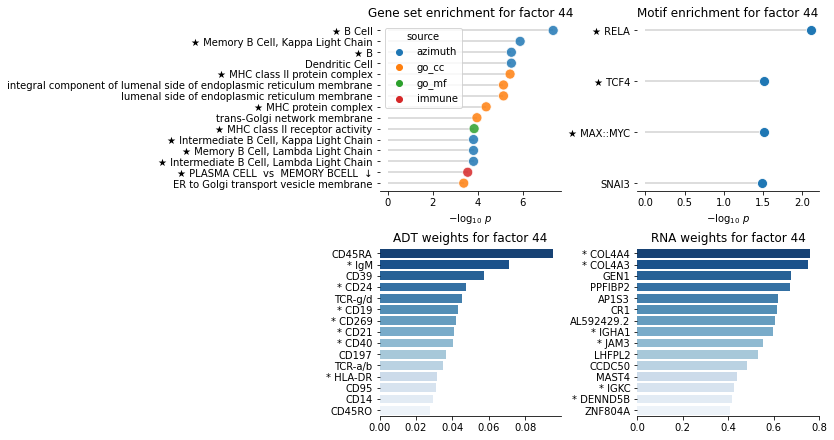

In [47]:
dim = 44
contains = ["BCELL"]
zoom_into_cluster = "B"
contains_not = ["TCELL", "DC", "MONO"]
star_cell_types = ["memory B-cell"]
pathway_files = ["cd19+_b_cells.txt.gz"]
gs_stars = [0, 1, 2, 4, 7, 9, 10, 11, 12, 13]#, 18]

fig, axes = plt.subplots(2, 3, figsize=(14, 6), constrained_layout=True)

idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
names = H_rna.obs_names[idx].to_list()
names = add_stars(names, star_cell_types)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"★ {name}"
sns.barplot(
    y=names,
    x=H_rna.X[idx, dim],
    ax=axes[1, 2],
    palette="Blues_r",
)
axes[1, 2].set_title(f"RNA weights for factor {dim}")
axes[1, 2].spines["top"].set_visible(False)
axes[1, 2].spines["right"].set_visible(False)
axes[1, 2].spines["left"].set_visible(False)

idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
names = H_adt.obs_names[idx].to_list()
names = add_stars(names, star_cell_types, adt=True)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"★ {name}"
sns.barplot(
    y=names,
    x=H_adt.X[idx, dim],
    ax=axes[1, 1],
    palette="Blues_r",
)
axes[1, 1].set_title(f"ADT weights for factor {dim}")
axes[1, 1].spines["top"].set_visible(False)
axes[1, 1].spines["right"].set_visible(False)
axes[1, 1].spines["left"].set_visible(False)

axes[0, 0].remove()

idx_immune = enr["dim"] == dim
idx_immune &= enr["source"] == "immune"
for word in contains:
    idx_immune &= enr["name"].str.split("VS", expand=True)[1].str.contains(word)
for word in contains_not:
    idx_immune &= ~(enr["name"].str.contains(word))

idx_azimuth = enr["dim"] == dim
idx_azimuth &= enr["source"] == "azimuth"

idx_bp = enr["dim"] == dim
idx_bp &= enr["source"] == "go_bp"

idx_cc = enr["dim"] == dim
idx_cc &= enr["source"] == "go_cc"

idx_mf = enr["dim"] == dim
idx_mf &= enr["source"] == "go_mf"

idx = idx_immune | idx_azimuth | idx_bp | idx_cc | idx_mf

df = enr[idx].sort_values("minlogp", ascending=False)

df.loc[df["source"] == "immune", "name"] = (
    df.loc[df["source"] == "immune", "name"]
    .apply(lambda x: " ".join(x.split("_")[1:]))
    .str.replace(" DN", "  ↓")
    .str.replace(" UP", "  ↑")
    .str.replace("VS", " vs ")
)

df.loc[df["source"] == "azimuth", "name"] = df.loc[
    df["source"] == "azimuth", "name"
].str.replace(" CL[0-9]+", "", regex=True)

df.loc[df["source"] == "go_bp", "name"] = df.loc[
    df["source"] == "go_bp", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_mf", "name"] = df.loc[
    df["source"] == "go_mf", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_cc", "name"] = df.loc[
    df["source"] == "go_cc", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df = df.drop_duplicates("name").head(15)

names = df["name"].to_list()
for i in gs_stars:
    names[i] = f"★ {names[i]}"
df["name"] = names

if np.sum(idx) > 0:
    axes[0, 1].hlines(y=df["name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        x="minlogp",
        y="name",  # .apply(lambda x: x[:-13]),
        ax=axes[0, 1],
        hue="source",
        palette="tab10",
        alpha=0.85,
        estimator=max,
        ci=None,
        s=100,
        zorder=3,
    )
    axes[0, 1].set_xlabel(r"$-\log_{10}~p$")
    axes[0, 1].spines["top"].set_visible(False)
    axes[0, 1].spines["right"].set_visible(False)
    axes[0, 1].spines["left"].set_visible(False)
    axes[0, 1].set_title(f"Gene set enrichment for factor {dim}")
    axes[0, 1].set_ylabel(None)
else:
    axes[0, 1].remove()

idx = all_motifs["dim"] == dim
df = (
    all_motifs[idx]
    .copy()
    .sort_values("pvalue", ascending=True)
    .drop_duplicates("motif.name")
    .head(15)
)
for pathway_file in pathway_files:
    list_motifs = get_tf_gene_matches(dim, pathway_file)
    for motif in list_motifs:
        df.loc[df["motif.name"] == motif, "motif.name"] = f"★ {motif}"
if np.sum(idx) > 0:
    axes[0, 2].hlines(y=df["motif.name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        y="motif.name",
        x="minlogp",
        ax=axes[0, 2],
        palette="Blues_r",
        s=100,
        zorder=3,
    )
    axes[0, 2].set_xlabel(r"$-\log_{10}~p$")
    axes[0, 2].spines["top"].set_visible(False)
    axes[0, 2].spines["right"].set_visible(False)
    axes[0, 2].spines["left"].set_visible(False)
    axes[0, 2].set_title(f"Motif enrichment for factor {dim}")
    axes[0, 2].set_ylabel(None)
else:
    axes[0, 2].remove()

axes[1, 0].remove()

plt.show()


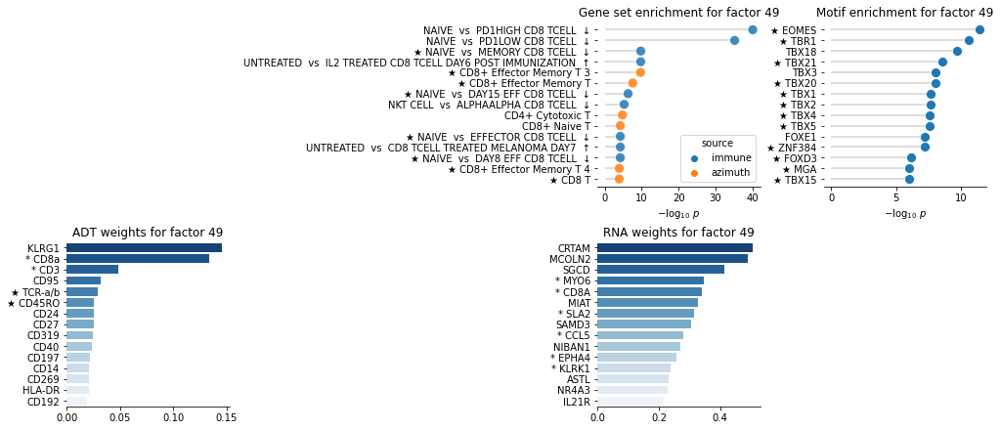

In [48]:
dim = 49
zoom_into_cluster = "CD8"
contains = ["CD8"]
contains_not = ["CD4", "BCELL", "DC", "MONO"]
star_cell_types = ["memory CD8 T-cell"]
manual_stars = [
    "CD45RO",  # Because memory
    "TCR-a/b",  # Because CD8 T cell
]
gs_stars = [2, 4, 5, 6, 10, 12, 13, 14]#, 15, 16, 18]
pathway_files = ["cd8+_t_cells.txt.gz"]

fig, axes = plt.subplots(2, 3, figsize=(14, 6), constrained_layout=True)

idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
names = H_rna.obs_names[idx].to_list()
names = add_stars(names, star_cell_types)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"★ {name}"
sns.barplot(
    y=names,
    x=H_rna.X[idx, dim],
    ax=axes[1, 1],
    palette="Blues_r",
)
axes[1, 1].set_title(f"RNA weights for factor {dim}")
axes[1, 1].spines["top"].set_visible(False)
axes[1, 1].spines["right"].set_visible(False)
axes[1, 1].spines["left"].set_visible(False)

idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
names = H_adt.obs_names[idx].to_list()
names = add_stars(names, star_cell_types, adt=True)
for name in manual_stars:
    if name in names:
        names[names.index(name)] = f"★ {name}"
sns.barplot(
    y=names,
    x=H_adt.X[idx, dim],
    ax=axes[1, 0],
    palette="Blues_r",
)
axes[1, 0].set_title(f"ADT weights for factor {dim}")
axes[1, 0].spines["top"].set_visible(False)
axes[1, 0].spines["right"].set_visible(False)
axes[1, 0].spines["left"].set_visible(False)

axes[0, 0].remove()

idx_immune = enr["dim"] == dim
idx_immune &= enr["source"] == "immune"
for word in contains:
    idx_immune &= enr["name"].str.split("VS", expand=True)[1].str.contains(word)
for word in contains_not:
    idx_immune &= ~(enr["name"].str.contains(word))

idx_azimuth = enr["dim"] == dim
idx_azimuth &= enr["source"] == "azimuth"

idx_bp = enr["dim"] == dim
idx_bp &= enr["source"] == "go_bp"

idx_cc = enr["dim"] == dim
idx_cc &= enr["source"] == "go_cc"

idx_mf = enr["dim"] == dim
idx_mf &= enr["source"] == "go_mf"

idx = idx_immune | idx_azimuth | idx_bp | idx_cc | idx_mf

df = enr[idx].sort_values("minlogp", ascending=False)

df.loc[df["source"] == "immune", "name"] = (
    df.loc[df["source"] == "immune", "name"]
    .apply(lambda x: " ".join(x.split("_")[1:]))
    .str.replace(" DN", "  ↓")
    .str.replace(" UP", "  ↑")
    .str.replace("VS", " vs ")
)

df.loc[df["source"] == "azimuth", "name"] = df.loc[
    df["source"] == "azimuth", "name"
].str.replace(" CL[0-9]+", "", regex=True)

df.loc[df["source"] == "go_bp", "name"] = df.loc[
    df["source"] == "go_bp", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_mf", "name"] = df.loc[
    df["source"] == "go_mf", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df.loc[df["source"] == "go_cc", "name"] = df.loc[
    df["source"] == "go_cc", "name"
].str.replace(" \(GO:[0-9]+\)", "", regex=True)

df = df.drop_duplicates("name").head(15)

names = df["name"].to_list()
for i in gs_stars:
    names[i] = f"★ {names[i]}"
df["name"] = names

if np.sum(idx) > 0:
    axes[0, 1].hlines(y=df["name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        x="minlogp",
        y="name",  # .apply(lambda x: x[:-13]),
        ax=axes[0, 1],
        hue="source",
        palette="tab10",
        alpha=0.85,
        estimator=max,
        ci=None,
        s=100,
        zorder=3,
    )
    axes[0, 1].set_xlabel(r"$-\log_{10}~p$")
    axes[0, 1].spines["top"].set_visible(False)
    axes[0, 1].spines["right"].set_visible(False)
    axes[0, 1].spines["left"].set_visible(False)
    axes[0, 1].set_title(f"Gene set enrichment for factor {dim}")
    axes[0, 1].set_ylabel(None)
else:
    axes[0, 1].remove()

idx = all_motifs["dim"] == dim
df = (
    all_motifs[idx]
    .copy()
    .sort_values("pvalue", ascending=True)
    .drop_duplicates("motif.name")
    .head(15)
)
for pathway_file in pathway_files:
    list_motifs = get_tf_gene_matches(dim, pathway_file)
    for motif in list_motifs:
        df.loc[df["motif.name"] == motif, "motif.name"] = f"★ {motif}"
if np.sum(idx) > 0:
    axes[0, 2].hlines(y=df["motif.name"], xmin=0, xmax=df["minlogp"], color="lightgray")
    sns.scatterplot(
        data=df,
        y="motif.name",
        x="minlogp",
        ax=axes[0, 2],
        palette="Blues_r",
        s=100,
        zorder=3,
    )
    axes[0, 2].set_xlabel(r"$-\log_{10}~p$")
    axes[0, 2].spines["top"].set_visible(False)
    axes[0, 2].spines["right"].set_visible(False)
    axes[0, 2].spines["left"].set_visible(False)
    axes[0, 2].set_title(f"Motif enrichment for factor {dim}")
    axes[0, 2].set_ylabel(None)
else:
    axes[0, 2].remove()

axes[1, 2].remove()

plt.show()
